**Name:-chandan birendra pandit     
Position :-Machine Learning Intern         
ref:- CTI/A1/C76432**

**Task: Location-based Analysis**


 Objective: Perform a geographical analysis of the
 restaurants in the dataset.

# Data Preprocess

Preprocess the dataset by handling missing values,
encoding categorical variables, and splitting the data
into training and testing sets.

Importing necessary libraries


In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_csv('/content/Dataset .csv')

In [3]:
df.head(2)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591


In [4]:
df.shape

(9551, 21)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [6]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


In [7]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [8]:
df['Restaurant ID'].unique()

array([6317637, 6304287, 6300002, ..., 5915807, 5916112, 5927402])

In [9]:
df['Restaurant Name'].unique()

array(['Le Petit Souffle', 'Izakaya Kikufuji', 'Heat - Edsa Shangri-La',
       ..., 'Huqqa', 'A���k Kahve', "Walter's Coffee Roastery"],
      dtype=object)

In [10]:
df['Country Code'].unique()

array([162,  30, 216,  14,  37, 184, 214,   1,  94, 148, 215, 166, 189,
       191, 208])

In [11]:
df['Country Code'].value_counts()

,count
Country Code,
1,8652
216,434
215,80
30,60
214,60
189,60
148,40
208,34
14,24


In [12]:
df['City'].unique()

array(['Makati City', 'Mandaluyong City', 'Pasay City', 'Pasig City',
       'Quezon City', 'San Juan City', 'Santa Rosa', 'Tagaytay City',
       'Taguig City', 'Bras�_lia', 'Rio de Janeiro', 'S��o Paulo',
       'Albany', 'Armidale', 'Athens', 'Augusta', 'Balingup',
       'Beechworth', 'Boise', 'Cedar Rapids/Iowa City', 'Chatham-Kent',
       'Clatskanie', 'Cochrane', 'Columbus', 'Consort', 'Dalton',
       'Davenport', 'Des Moines', 'Dicky Beach', 'Dubuque',
       'East Ballina', 'Fernley', 'Flaxton', 'Forrest', 'Gainesville',
       'Hepburn Springs', 'Huskisson', 'Inverloch', 'Lakes Entrance',
       'Lakeview', 'Lincoln', 'Lorn', 'Macedon', 'Macon', 'Mayfield',
       'Mc Millan', 'Middleton Beach', 'Miller', 'Monroe', 'Montville',
       'Ojo Caliente', 'Orlando', 'Palm Cove', 'Paynesville', 'Penola',
       'Pensacola', 'Phillip Island', 'Pocatello', 'Potrero', 'Princeton',
       'Rest of Hawaii', 'Savannah', 'Singapore', 'Sioux City',
       'Tampa Bay', 'Tanunda', 'Trentha

In [13]:
df['City'].value_counts()

,count
City,
New Delhi,5473
Gurgaon,1118
Noida,1080
Faridabad,251
Ghaziabad,25
...,...
Panchkula,1
Mc Millan,1
Mayfield,1


In [14]:
df['Address'].unique()

array(['Third Floor, Century City Mall, Kalayaan Avenue, Poblacion, Makati City',
       'Little Tokyo, 2277 Chino Roces Avenue, Legaspi Village, Makati City',
       'Edsa Shangri-La, 1 Garden Way, Ortigas, Mandaluyong City', ...,
       'Kuru�_e��me Mahallesi, Muallim Naci Caddesi, No 56, Be��ikta��, ��stanbul',
       'Kuru�_e��me Mahallesi, Muallim Naci Caddesi, No 64/B, Be��ikta��, ��stanbul',
       'Cafea��a Mahallesi, Bademalt۱ Sokak, No 21/B, Kad۱k�_y, ��stanbul'],
      dtype=object)

In [15]:
df['Address'].value_counts()

,count
Address,
"Dilli Haat, INA, New Delhi",11
"Sector 41, Noida",11
"Greater Kailash (GK) 1, New Delhi",10
"The Imperial, Janpath, New Delhi",9
"Cyber Hub, DLF Cyber City, Gurgaon",8
...,...
"23-24, Defence Colony Market, Defence Colony, New Delhi",1
"28, Main Market, Defence Colony, New Delhi",1
"Daryaganj, New Delhi",1


In [16]:
df['Locality'].unique()

array(['Century City Mall, Poblacion, Makati City',
       'Little Tokyo, Legaspi Village, Makati City',
       'Edsa Shangri-La, Ortigas, Mandaluyong City', ..., 'Ko��uyolu',
       'Kuru�_e��me', 'Moda'], dtype=object)

In [17]:
df['Locality'].value_counts()

,count
Locality,
Connaught Place,122
Rajouri Garden,99
Shahdara,87
Defence Colony,86
Malviya Nagar,85
...,...
"Lemon Tree Premier, Sector 29",1
"Omaxe Celebration Mall, Sohna Road, Gurgaon",1
"Park Inn, Sector 15, Gurgaon",1


In [18]:
df['Cuisines'].unique()

array(['French, Japanese, Desserts', 'Japanese',
       'Seafood, Asian, Filipino, Indian', ..., 'Burger, Izgara',
       'World Cuisine, Patisserie, Cafe', 'Italian, World Cuisine'],
      dtype=object)

In [19]:
df['Cuisines'].value_counts()

,count
Cuisines,
North Indian,936
"North Indian, Chinese",511
Chinese,354
Fast Food,354
"North Indian, Mughlai",334
...,...
"Bengali, Fast Food",1
"North Indian, Rajasthani, Asian",1
"Chinese, Thai, Malaysian, Indonesian",1


In [20]:
df['Average Cost for two'].unique()

array([  1100,   1200,   4000,   1500,   1000,   2000,   6000,    800,
          900,    700,    850,    600,   3000,   1800,     55,     30,
           45,     60,     50,     80,     90,    200,    150,    100,
          230,    240,    350,    140,    170,    120,    250,     40,
           70,    300,     85,     75,    400,     65,     25,     10,
            0,     20,     35,      7,    270,    500,    430,    315,
          220,     95,    190,    260,    180,    330,    280,    160,
          285,    130,    110,   2500,   3600,    550,   1400,    450,
          950,    650,   1300,   2400,   1600,   2200,    750,   1700,
         1250,   1900,   2700,   3500,   5000,   2300,   1750,   3200,
         2100,   1850,   4500,   3300,   1350,   1650,   1950,   1050,
          290,   1450,   2800,   3650,   4800,   1550,    720,   6500,
         7000,   1150,   2900,   2600,   4700,   3700,   3800,   4100,
         4300,   2650,   5100,   5500,   4400,   4200,   8000,   2350,
      

In [21]:
df['Average Cost for two'].value_counts()

,count
Average Cost for two,
500,900
300,897
400,857
200,687
600,652
...,...
8000,1
2350,1
150000,1


In [22]:
df['Currency'].unique()

array(['Botswana Pula(P)', 'Brazilian Real(R$)', 'Dollar($)',
       'Emirati Diram(AED)', 'Indian Rupees(Rs.)',
       'Indonesian Rupiah(IDR)', 'NewZealand($)', 'Pounds(��)',
       'Qatari Rial(QR)', 'Rand(R)', 'Sri Lankan Rupee(LKR)',
       'Turkish Lira(TL)'], dtype=object)

In [23]:
df['Currency'].value_counts()

,count
Currency,
Indian Rupees(Rs.),8652
Dollar($),482
Pounds(��),80
Brazilian Real(R$),60
Emirati Diram(AED),60
Rand(R),60
NewZealand($),40
Turkish Lira(TL),34
Botswana Pula(P),22


In [24]:
df['Has Table booking'].value_counts()

,count
Has Table booking,
No,8393
Yes,1158


In [25]:
df['Has Online delivery'].value_counts()

,count
Has Online delivery,
No,7100
Yes,2451


In [26]:
df['Is delivering now'].value_counts()

,count
Is delivering now,
No,9517
Yes,34


In [27]:
df['Switch to order menu'].unique()

array(['No'], dtype=object)

In [28]:
df['Switch to order menu'].value_counts()

,count
Switch to order menu,
No,9551


In [29]:
df['Price range'].unique()

array([3, 4, 2, 1])

In [30]:
df['Aggregate rating'].value_counts()

,count
Aggregate rating,
0.0,2148
3.2,522
3.1,519
3.4,498
3.3,483
3.5,480
3.0,468
3.6,458
3.7,427


In [31]:
df['Rating color'].value_counts()

,count
Rating color,
Orange,3737
White,2148
Yellow,2100
Green,1079
Dark Green,301
Red,186


In [32]:
df['Rating text'].value_counts()

,count
Rating text,
Average,3737
Not rated,2148
Good,2100
Very Good,1079
Excellent,301
Poor,186


In [33]:
df['Votes'].value_counts()

,count
Votes,
0,1094
1,483
2,327
3,244
4,207
...,...
615,1
538,1
823,1


In [34]:
df['Cuisines'].fillna(df['Cuisines'].mode()[0], inplace=True)

<ipython-input-34-0293b22786c4>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Cuisines'].fillna(df['Cuisines'].mode()[0], inplace=True)


In [35]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,0


# **EDA**

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

In [37]:
map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(map)

for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Name: {row['Restaurant Name']}\nRating: {row['Aggregate rating']}\nCity: {row['City']}"
    ).add_to(marker_cluster)
map

The latitude and longitude coordinates of the restaurants can be visualized on a map to provide a clear geographical distribution. This visualization can help identify clusters of restaurants, highlight densely populated areas, and reveal patterns such as proximity to urban centers or major transportation hubs. By mapping the distribution, we can better understand regional trends, target market demographics, and areas with potential for restaurant growth or expansion.

           City  Restaurant Count
0     New Delhi              5473
1       Gurgaon              1118
2         Noida              1080
3     Faridabad               251
4     Ghaziabad                25
5  Bhubaneshwar                21
6      Amritsar                21
7     Ahmedabad                21
8       Lucknow                21
9      Guwahati                21


<ipython-input-38-cf82673673ae>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Restaurant Count', y='City', data=city_counts.head(10), palette='viridis')


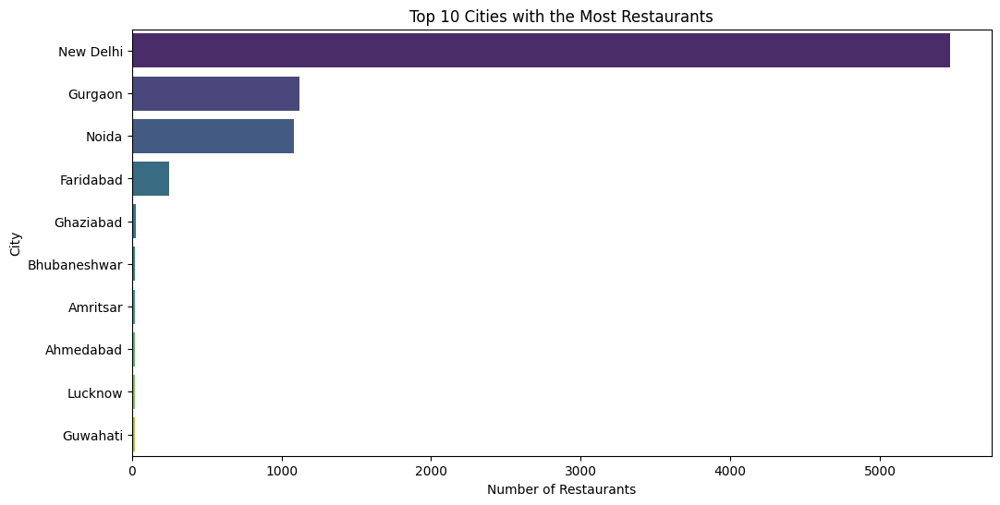

In [38]:
city_counts = df['City'].value_counts().reset_index()
city_counts.columns = ['City', 'Restaurant Count']
print(city_counts.head(10))
plt.figure(figsize=(12, 6))
sns.barplot(x='Restaurant Count', y='City', data=city_counts.head(10), palette='viridis')
plt.title('Top 10 Cities with the Most Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()


New Delhi has the highest number of restaurants (5,473), which is significantly greater than any other city.There is a sharp drop in restaurant counts as we move to other cities like Gurgaon (1,118) and Noida (1,080), indicating that these cities have less dense restaurant markets compared to New Delhi.and rest of the cities having very low numbers restaurent.

                 City  Aggregate rating
56         Inner City          4.900000
107       Quezon City          4.800000
73        Makati City          4.650000
95         Pasig City          4.633333
75   Mandaluyong City          4.625000
15         Beechworth          4.600000
67             London          4.535000
123       Taguig City          4.525000
122     Tagaytay City          4.500000
116      Secunderabad          4.500000


<ipython-input-39-e5a32c5a6a8f>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Aggregate rating', y='City', data=city_ratings.head(10), palette='coolwarm')


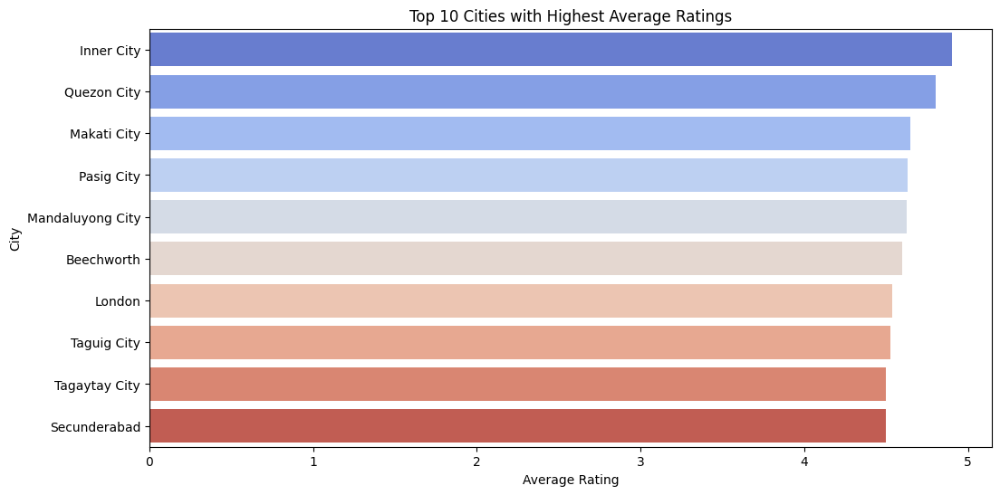

In [39]:
city_ratings = df.groupby('City')['Aggregate rating'].mean().reset_index()
city_ratings = city_ratings.sort_values(by='Aggregate rating', ascending=False)
print(city_ratings.head(10))
plt.figure(figsize=(12, 6))
sns.barplot(x='Aggregate rating', y='City', data=city_ratings.head(10), palette='coolwarm')
plt.title('Top 10 Cities with Highest Average Ratings')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.show()


The aggregate ratings highlight a strong trend of customer satisfaction across various cities, with most cities achieving average ratings above 4.4. Inner City and Quezon City lead the list with outstanding ratings of 4.9 and 4.8, reflecting exceptional service or dining experiences.



                         Cuisines  Count
0                    North Indian    945
1           North Indian, Chinese    511
2                         Chinese    354
3                       Fast Food    354
4           North Indian, Mughlai    334
5                            Cafe    299
6                          Bakery    218
7  North Indian, Mughlai, Chinese    197
8                Bakery, Desserts    170
9                     Street Food    149


<ipython-input-40-fd31178bdf7b>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Count', y='Cuisines', data=cuisine_counts.head(10), palette='Set2')


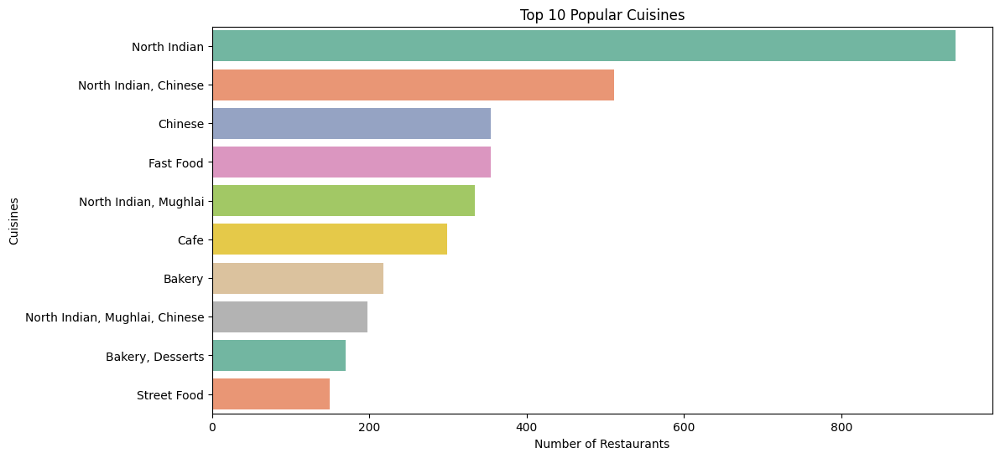

In [40]:
cuisine_counts = df['Cuisines'].value_counts().reset_index()
cuisine_counts.columns = ['Cuisines', 'Count']
print(cuisine_counts.head(10))
plt.figure(figsize=(12, 6))
sns.barplot(x='Count', y='Cuisines', data=cuisine_counts.head(10), palette='Set2')
plt.title('Top 10 Popular Cuisines')
plt.xlabel('Number of Restaurants')
plt.ylabel('Cuisines')
plt.show()


North Indian cuisine is the most popular, with the highest number of restaurants offering it, far surpassing other cuisines. Combinations like "North Indian, Chinese" and "North Indian, Mughlai" are also highly popular, showcasing a strong preference for diverse culinary options in cities. Chinese and Fast Food cuisines follow as the next most sought-after choices, reflecting widespread demand for both local and global fast-service food. Additionally, the popularity of multi-cuisine combinations highlights the growing customer demand for variety and versatility in dining options

                 City  Price range
104         Princeton     4.000000
56         Inner City     4.000000
133  Vineland Station     4.000000
60       Johannesburg     4.000000
93          Panchkula     4.000000
94         Pasay City     4.000000
97        Paynesville     4.000000
113           Sandton     3.818182
75   Mandaluyong City     3.750000
103          Pretoria     3.700000


<ipython-input-41-dd4243d28fb7>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Price range', y='City', data=city_price.head(10), palette='magma')


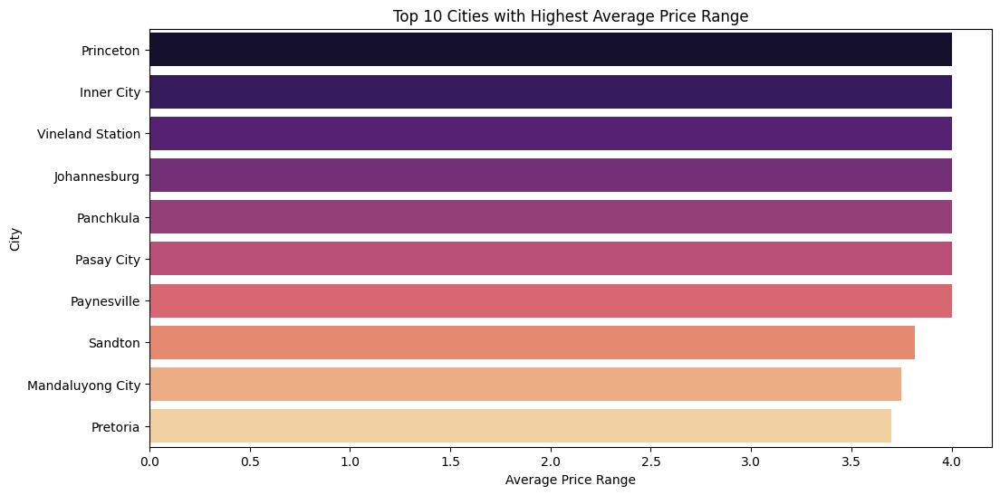

In [41]:
city_price = df.groupby('City')['Price range'].mean().reset_index()
city_price = city_price.sort_values(by='Price range', ascending=False)
print(city_price.head(10))
plt.figure(figsize=(12, 6))
# Pass 'city_price.head(10)' to the 'data' parameter
sns.barplot(x='Price range', y='City', data=city_price.head(10), palette='magma')
plt.title('Top 10 Cities with Highest Average Price Range')
plt.xlabel('Average Price Range')
plt.ylabel('City')
plt.show()


Princeton, Inner City, Vineland Station, Johannesburg, Panchkula, Pasay City, and Paynesville stand out with the highest price range of 4.0, indicating premium pricing and highlighting their reputation for upscale restaurant options. Cities like Sandton (3.82), Mandaluyong City (3.75), and Pretoria (3.7) also fall within the higher price segment, catering to affluent customers, although slightly below the top-tier cities. In contrast, cities such as Lakeview, Lakes Entrance, Inverloch, Fernley, and Clatskanie have a significantly lower price range of 1.0, reflecting more affordable dining options and potentially a focus on budget-friendly offerings. This stark difference highlights the diversity in restaurant markets across regions.
